#Install Dependencies



In [ ]:
!nvidia-smi

Wed Jul 14 15:52:09 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   67C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt  # install dependencies

import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.9.0+cu102 (Tesla T4)


In [ ]:

from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.9.0+cu102 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
# Export code snippet and paste here
%cd /content
!curl -L ...

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1662      0 --:--:-- --:--:-- --:--:--  1659
100 30.9M  100 30.9M    0     0  25.8M      0  0:00:01  0:00:01 --:--:-- 25.8M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/blurred_img1000_jpg.rf.a687f5e3a55799b7c11d09beba708354.jpg  
 extracting: test/images/blurred_img1004_jpg.rf.be87a5a37c2062f2e7c13b6b1b1c3bec.jpg  
 extracting: test/images/blurred_img1012_jpg.rf.768d5d6a083e9a62015de7c709904279.jpg  
 extracting: test/images/blurred_img101_jpg.rf.c6dd29b6c2bbef9b381ca3309b4005b2.jpg  
 extracting: test/images/blurred_img1057_jpg.rf.02ff7c48a03111dd40609b6b9168e60a.jpg  
 extracting: test/images/blurred_img107_jpg.rf.918626717bc508dfdebd04fb843b0055.jpg  
 extracting

In [ ]:

%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 7
names: ['buoy', 'catamaran', 'coast-guard', 'fishing boat', 'freight-boat', 'sailboat', 'yacht']

# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#this is the model configuration we will use for
%cat /content/yolov5/models/yolov5s.yaml

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector




Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
!pip install wandb

     |████████████████████████████████| 1.8MB 9.6MB/s 
     |████████████████████████████████| 143kB 55.6MB/s 
     |████████████████████████████████| 174kB 53.7MB/s 
     |████████████████████████████████| 102kB 14.2MB/s 
     |████████████████████████████████| 71kB 11.7MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-cp37-none-any.whl size=8807 sha256=4de9e72f72fd577e15a3409b65b703dac479cdb4bd63b47567d1d510e0c80780
  Stored in directory: /root/.cache/pip/wheels/0b/04/79/c3b0c3a0266a3cb4376da31e5bfe8bba0c489246968a68e843
  Created wheel for subprocess32: filename=subprocess32-3.5.4-cp37-none-any.whl size=6502 sha256=bed8293aee9cd31987568cebeec4a0a0ca1348a9989728065d9c29264ae35d16
  Stored in directory: /root/.cache/pip/wheels/68/39/1a/5e402bdfdf004af1786c8b853fd92f8c4a04f22aad179654d1
Successfully built pathtools subprocess32


In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
#b.data[:, 4] += math.log(8 / (640 / s) ** 2)  # obj (8 objects per 640 image)
#b.data[:, 5:] += math.log(0.6 / (m.nc - 0.99)) if cf is None else torch.log(cf / cf.sum())  # cls
%cd /content/yolov5/
!python train.py --img 1024 --batch 16 --epochs 80 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=80, batch_size=16, img_size=[1024], rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache_images=True, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=yolov5s_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-289-g720aaa6 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees

# Evaluation of the  ship detection Performance

In [ ]:
# Start tensorboard
#model max out at 53 step

# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

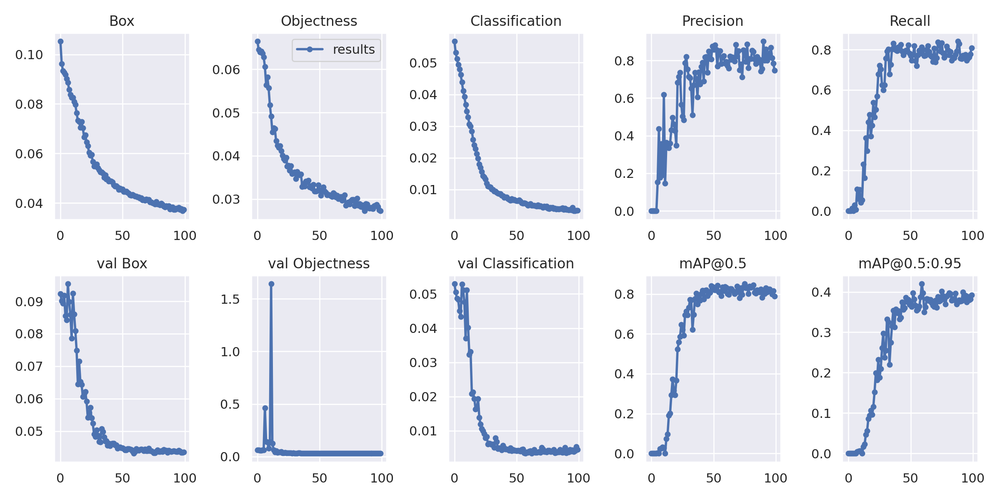

In [ ]:

from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results2/results.png', width=1000)  # view results.png
#Precision-What proportion of positive identifications was actually correct?
#Recall-What proportion of actual positives was identified correctly?

###  Visualize Our Training Data with Labels



GROUND TRUTH TRAINING DATA:


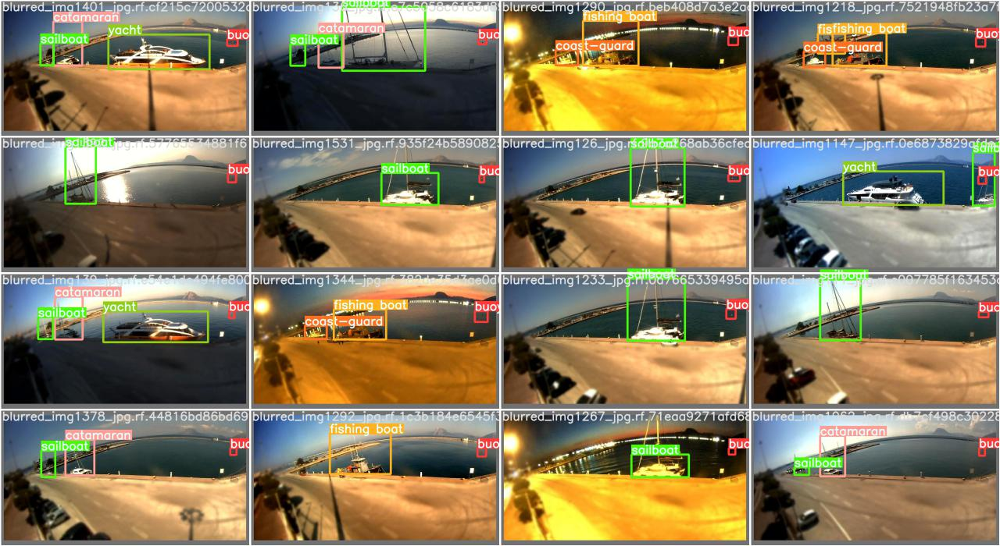

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results2/test_batch2_labels.jpg', width=1024)

GROUND TRUTH AUGMENTED TRAINING DATA:


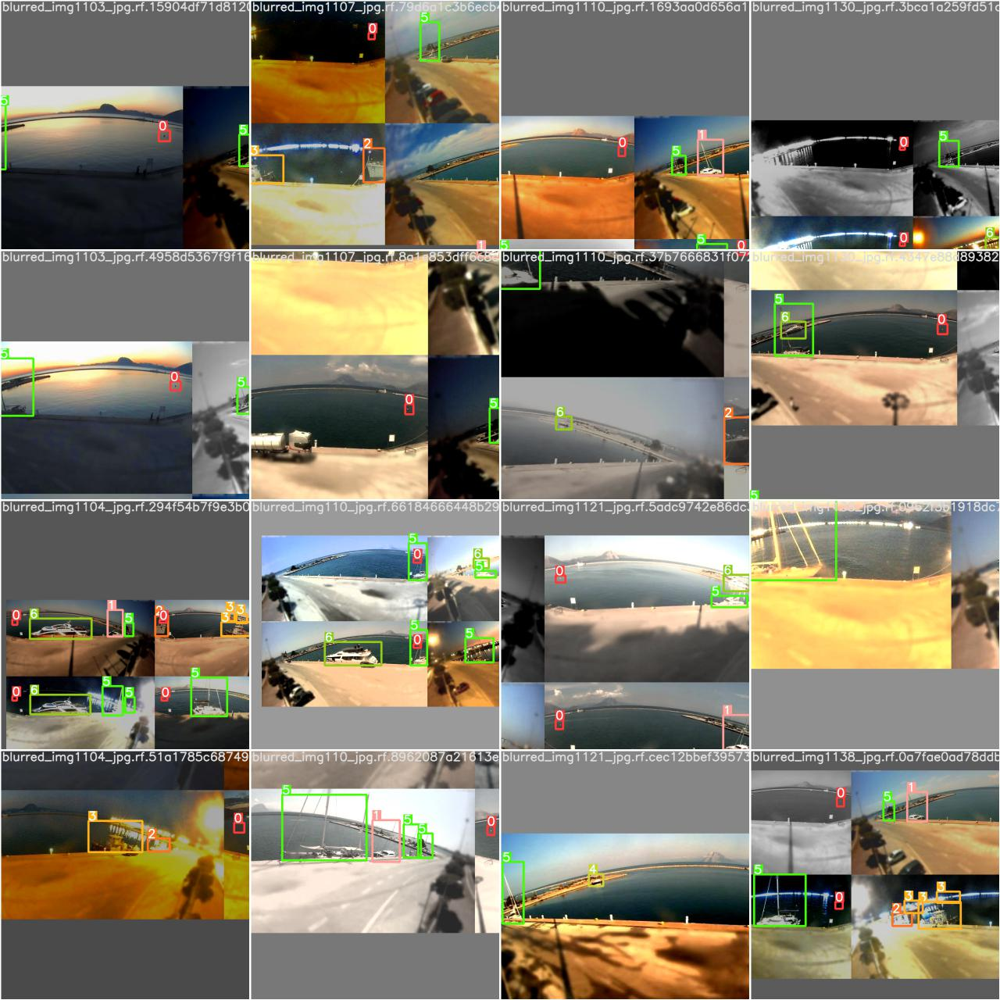

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results2/train_batch2.jpg', width=1024)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` 

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

In [ ]:

# use the best weights!
%cd /content/yolov5/
#1900 is good
!python detect.py    --line-thickness 1 --weights runs/train/yolov5s_results2/weights/best.pt --img 1024 --conf 0.4 --source ../test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results2/weights/best.pt'], source=../test/images, imgsz=1024, conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False
YOLOv5 🚀 v5.0-284-g647223a torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 232 layers, 7262700 parameters, 0 gradients,

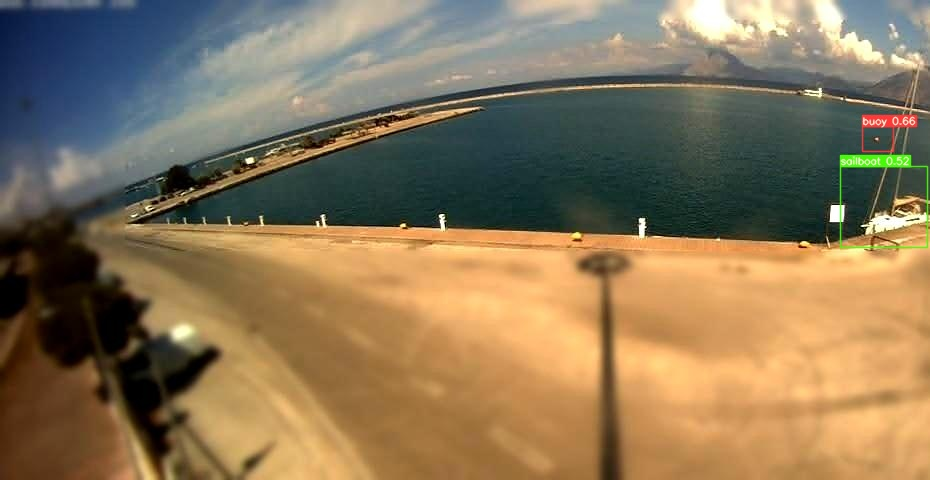

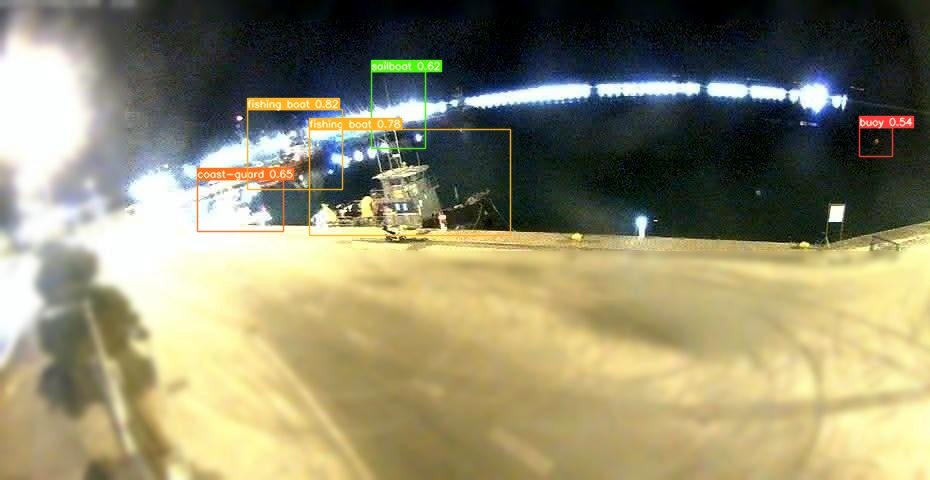

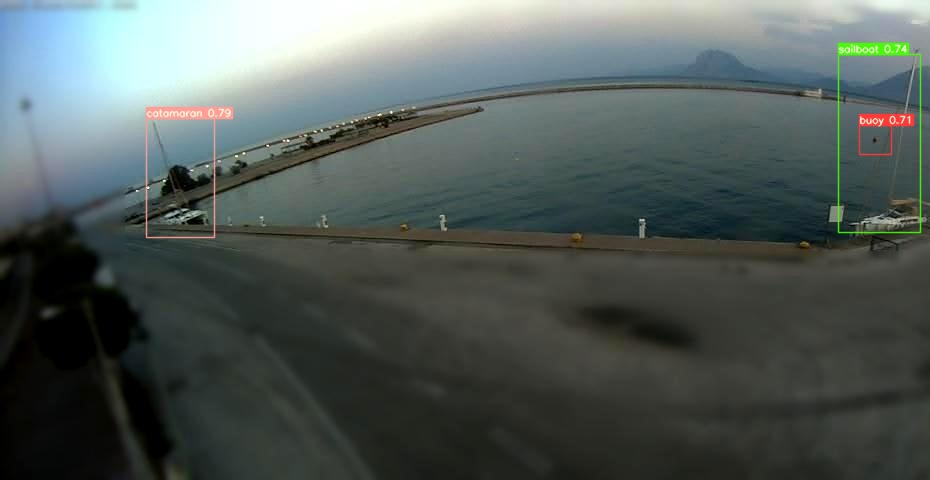

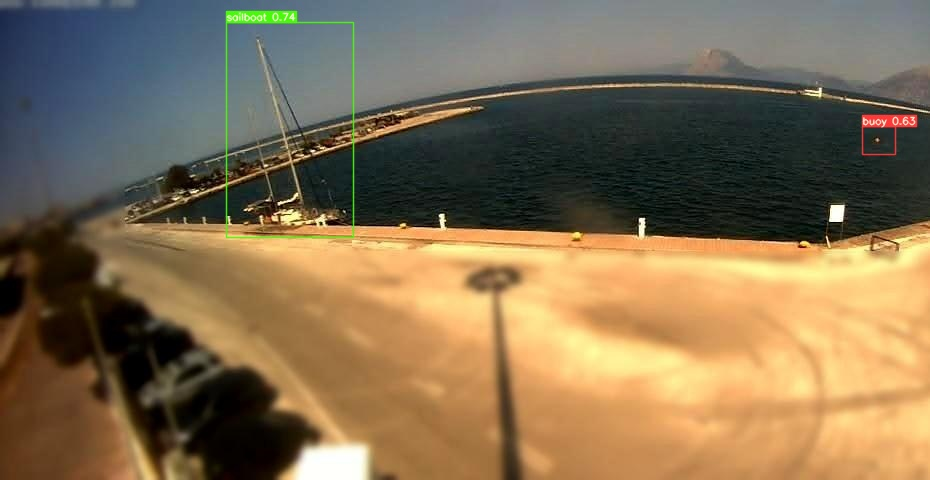

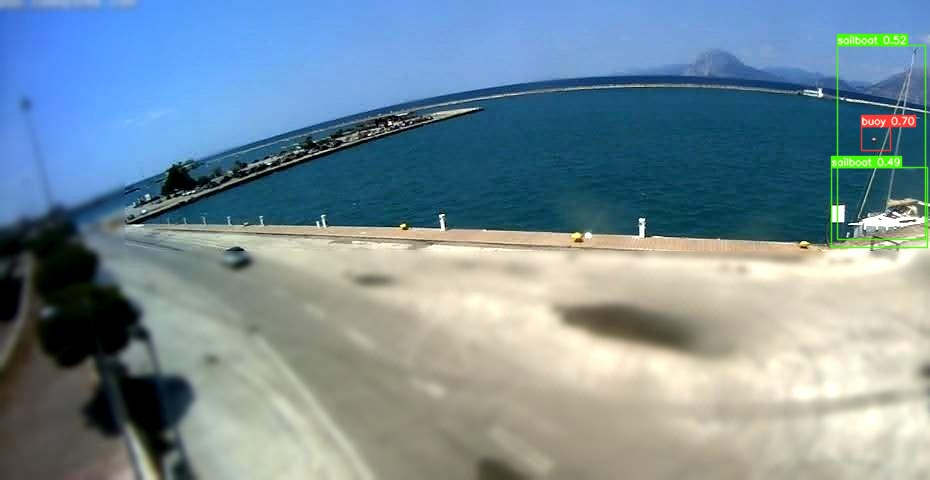

...

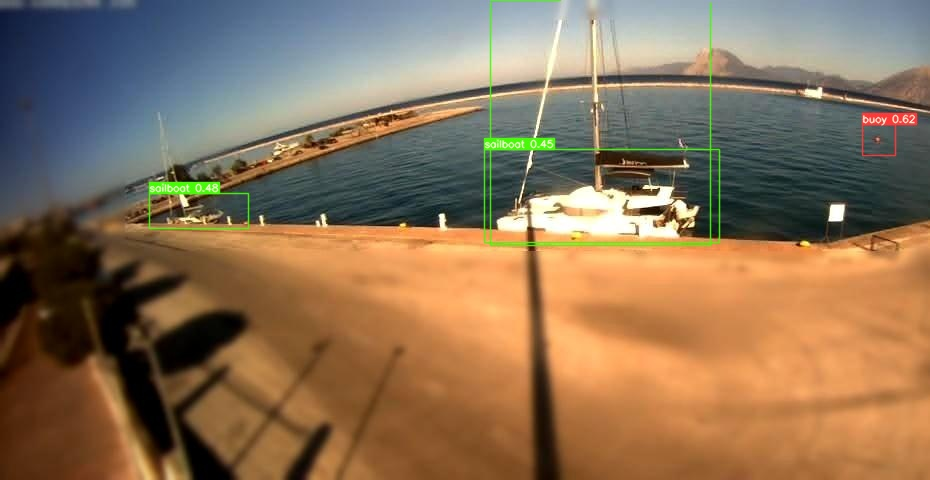

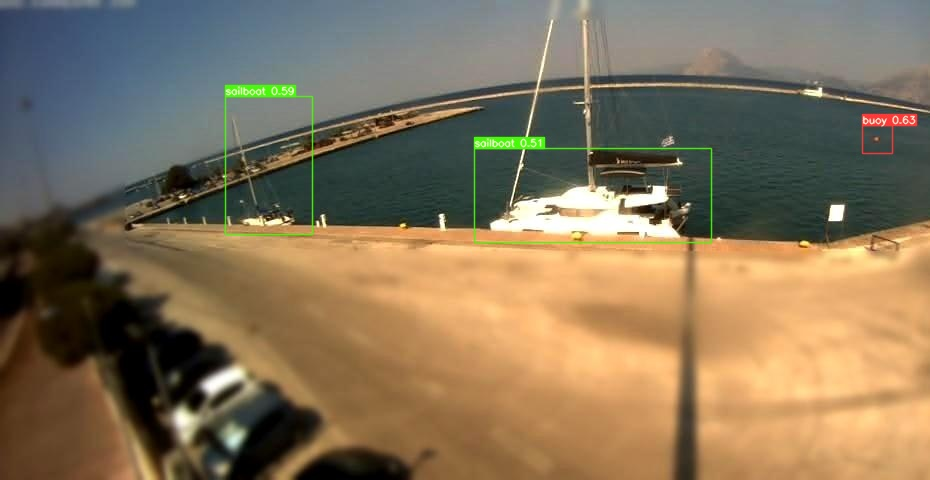

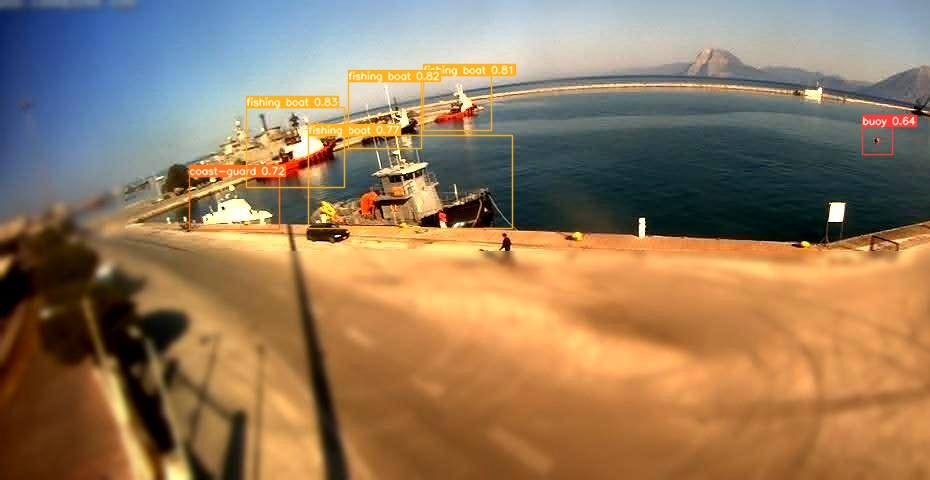

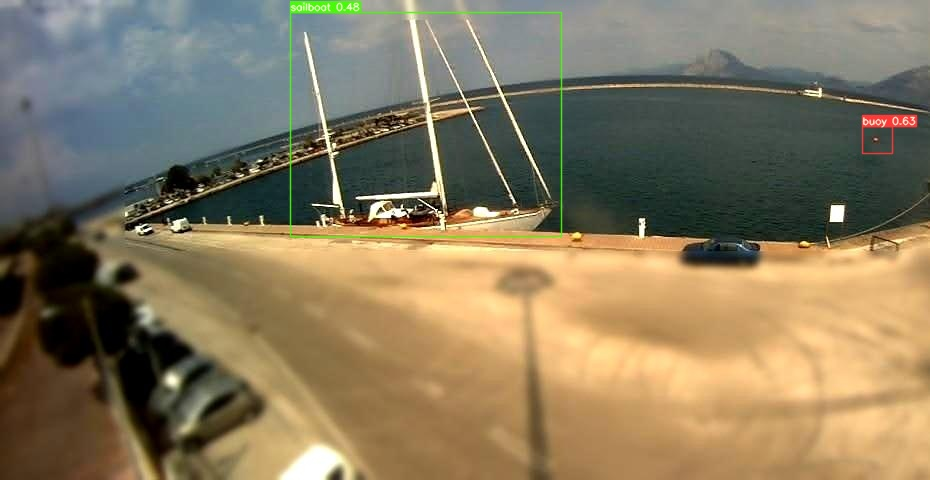

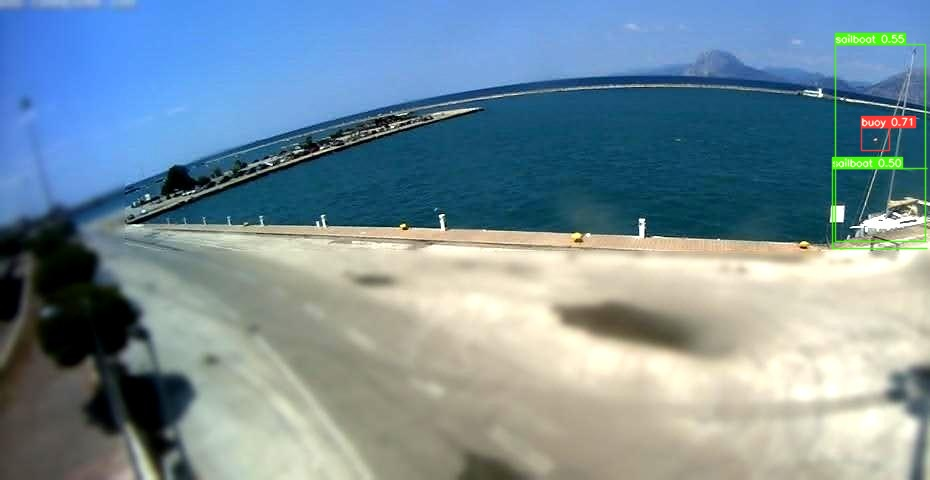

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): 
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results2/weights/best.pt /content/drive/MyDrive/Weights

In [ ]:
!python detect.py    --line-thickness 3 --weights runs/train/yolov5s_results2/weights/best.pt  --conf 0.3 --source https://www.youtube.com/watch?v=hJHkil8HOHo

Streaming output truncated to the last 5000 lines.
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.010s)
0: 384x640 Done. (0.008s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.009s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.007s)
0: 384x640 Done. (0.007s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.008s)
0: 384x640 Done. (0.007s)
0: 384x640 Done. (0.010s)
0: 384x640 Done. (0.008s)
0: 384x640 Done. (0.007s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.007s)
0: 384x640 Done. (0.007s)
0: 384x640 Done. (0.007s)
0: 384x640 Done. (0.008s)
0: 384x640 Done. (0.007s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.007s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.008s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.013s)
0: 384x640 Done. (0.006s)
0: 384x640 Done. (0.007s)
0: 384x640 Done. (0.007s)
0: 384x640 Do